# Exploratory Data Analysis 

-------------

# Table of content

- [1. Quick Look](#section1)
- [2. Global exploratory analysis of each playlist](#section2)
    - [2.1 Distribution of response variables](#section21)
    - [2.2 Distributions of the predictors](#section22)
    - [2.3 Exploring relationship between response and predictor](#section23)
- [3. Exploratory analysis by genre](#section3)
    - [3.1 Distribution of audio features](#section31)
    - [3.2 Relationship between audio features and response](#section32)
- [4. Additional data analysis on tracks](#section4)
    - [4.1 Song trends](#section41)
    - [4.2 PCA on tracks](#section42)

------

## EDA Summary

In conclusion, our exploratory data analysis revealed the following:

1. **Quick Look**
    - The main dataset we are going to use is based on the playlists we've scraped from Spotify, thanks to the API. At the end we obtained 8832 observations and 50 feautures (49 predictors and 1 response variable).


2. **Global Data Analysis**
     - Variable Distribution Analysis 
         - Response variable: We found extreme right skewness in the response variable, which prompted us to take its log transformation. We used this log-transformed variable (`log_num_followers`) in all subsequent analyses. 
         - Categorical predictor variables: We found that the playlists are fairly imbalanced (i.e. they are overwhelmingly of the pop `genre` and mode key of 1 with a mode time signature of 4. This may have some bearings in how predictive our model is in less represented genres/mode keys/ mode time signatures. 
         - Numeric predictor variables: Numeric predictors have varying degrees of skewness, ranging from extremely right skewed to fairly normally distributed.
     - Response vs. Predictor Variable:
         - Categorical predictor variables: We found that all categorical features (`genre`, `mode key`, and `mode time signature`) are associated with `log_num_followers`
         - Numeric predictor variables: We found that `log_num_followers` of a playlist has weak associations with all 6 different measures of its content popularity (i.e. **average track**, **average album**, **average artist** and **max track**, **max album** and **max artist** popularities). In addition, we found varying degrees of multicollinearity between audio features. Finally we found that when overall audio features are considered, no audio feature seems to have any apparent correlation with `log_num_followers`.

3. **Exploratory Analysis by Genre**
    - Distribution of Audio Features by Genre: From both boxplots and parallel coordinate plots, we found that audio features clearly clusters by genre. This is a strong indication that we whould consider interaction terms between `genre` and audio features going forward.
    - Distribution of Other Numeric Features by Genre: We found no apparent clustering by genre in other numeric features such as the popularity features and number, suggesting interaction terms between `genre` and these features are likely not going to be useful.
    - Relationship between Audio Features and Response by Genre: We found that certain numerical features appear to be associated with the response only in certain genres and not in others. This suggests that adding interaction terms between `genre` and audio features may help improve the predictive performance of the regression model. 
    
    
4. **Additional Data Analysis**
    - Song Trends: There is a positive correlation between valence and danceability as we suspected. There seems to be a strong negative correlation between energy and acousticness. With a few exceptions, artists with high energy songs produce low acousticness. The average acousticness in the entire dataset is 0.32
    - PCA on tracks: Next, we generate a list of "chosen" traits and use principal component analysis to reduce the dimensions of that list to 3, effectively creating a matrix suitable for generating the following 3-dimensional plot. The lesser the distance between any two songs, the larger the similarities in their traits. We also created a second plot reducing the dimensions to 2, where the y-axis tells us 'How metal a song is' and x-axis instead tells us 'How danceable a song is'.

--------

In [42]:
# Libraries used for Playlist EDA
from copy import deepcopy
import collections
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
from IPython.display import Image
from IPython.display import display
from pandas.tools.plotting import parallel_coordinates
from sklearn.preprocessing import PolynomialFeatures
%matplotlib inline

# Libraries used for Tracks EDA
import matplotlib.ticker as ticker
from sklearn import datasets, linear_model
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings("ignore")

------

## Reusable functions

Since multiple steps are repeated over the course of the code we decided to write a single function and by specifying the type of plot it will display different ones.

**INPUT**:

- df: Dataframe used in the project (playlists and tracks) <br/><br/>
- features: Feautures we want to plot <br/><br/>
- figrow: Number of plots per row <br/><br/>
- figcol: Number of plots per column<br/><br/>
- figsize: Size of the plot<br/><br/>
- plot_type: Type of plot we want to display <br/><br/>

In [43]:
def plot(df, features, figrow, figcol, figsize, plot_type):

    ########################## DISTRIBUTION ##################################
    
    if plot_type == 'distribution':
        

        if len(features) == 1:
            predictor = features[0]
            x = df[predictor].tolist()
            fig, ax = plt.subplots(1, 1, figsize = figsize)
            sns.distplot(x, hist=True,kde=False, axlabel = predictor)
        else:
            fig, axes = plt.subplots(figrow, figcol, figsize = (figsize))
            axes = axes.flatten()
            for i, predictor in enumerate(features):
                x = df[predictor].tolist()
                sns.distplot(x, hist=True,kde=False, ax = axes[i], axlabel = predictor)
    
    ########################## COUNTPLOT ####################################
    
    elif plot_type == 'countplot':
        sns.set(font_scale = 1.5)    
        if len(features) == 1:
            predictor = features[0]
            x = df[predictor].tolist()
            fig, ax = plt.subplots(1, 1, figsize = figsize)
            sns.countplot(y=predictor, data=df, saturation=1.5, order = df[predictor].value_counts().index)

        else:
            fig, axes = plt.subplots(figrow, figcol, figsize = figsize)
            axes = axes.flatten()
            for i, predictor in enumerate(features):
                sns.countplot(y=predictor, data=df, saturation=1.5, order = df[predictor].value_counts().index, ax = axes[i])
                
    ########################## SCATTERPLOT ##################################

    elif plot_type == 'scatter':
        fig, axes = plt.subplots(figrow, figcol, figsize = figsize)
        axes = axes.flatten()
        for i, predictor in enumerate(features):
            sns.scatterplot(data=df, x=predictor, y="log_num_followers", ax = axes[i])
            
    ########################## BOXPLOT ######################################
    
    elif plot_type == 'boxplot':
        fig, ax = plt.subplots(figrow, figcol, figsize = figsize, sharex = True, sharey = True)
        ax = ax.flatten()
        for index, (g, group) in enumerate(df.groupby('genre')):
            sns.boxplot(data=group[features], ax=ax[index], orient = 'h') 
            ax[index].set_xlabel('')
            ax[index].set_title(g, fontsize=18)
            
    ########################## PARALLEL ######################################
    
    elif plot_type == 'parallel':
        sns.set(font_scale = 1.5)    
        fontsize = 30
        line_width = 20
        selected_genres = ['classical', 'funk', 'punk', 'reggae', 'country']
        dfpp = df[df['genre'].isin(selected_genres)][features].copy()
        dfpp_norm = (dfpp - dfpp.mean()) / (dfpp.max() - dfpp.min())
        dfpp_norm['genre'] = df[df['genre'].isin(selected_genres)]['genre']
        fig, ax = plt.subplots(1, 1, figsize = figsize)

        with sns.axes_style('white'):
            parallel_coordinates(dfpp_norm, 'genre', alpha=0.6, ax = ax, colormap = 'Accent')
            leg = ax.legend(fontsize = fontsize, loc = 'upper_left')
            for legobj in leg.legendHandles:
                legobj.set_linewidth(line_width)

    ########################## SCATTER RESPONSE ###############################
    
    elif plot_type == 'scatterresponse':
        genres = ['classical', 'funk', 'punk', 'reggae', 'country']
        fig, ax = plt.subplots(figrow, figcol, figsize = figsize)
        for genre_i, genre in enumerate(genres):
            for feature_i, feature in enumerate(features):
                ax[genre_i][feature_i].scatter(df[feature][df['genre']==genre],df['log_num_followers'][df['genre']==genre], alpha = 0.5)
                ax[genre_i][feature_i].axhline(y = np.mean(df['log_num_followers'][df['genre']==genre]), color = 'purple')
                ax[genre_i][feature_i].set_xlabel(feature)
                ax[genre_i][feature_i].set_ylabel('log_num_followers')
                ax[genre_i][feature_i].set_title(feature + ' vs log_num_followers in ' + genre, fontsize=14)
        plt.tight_layout()


---

## 1. Quick look
<a id='section1'></a>

In [44]:
# Load data files
directory = r'C:\Users\Luca\Desktop\Statistical Learning Project\OUR CODE\Data'
df = pd.read_csv(directory+r'\playlists.csv')
df.head()

,id,num_followers,collaborative,num_tracks,track_acousticness_avg,track_acousticness_std,track_album_popularity_avg,track_album_popularity_std,track_album_popularity_max,track_artists_genres_unique,...,track_std_artist_num_followers_std,track_std_artist_popularity_avg,track_std_artist_popularity_std,track_tempo_avg,track_tempo_std,track_time_signature_mode,track_time_signature_unique,track_valence_avg,track_valence_std,genre
0,37i9dQZF1DX9sIqqvKsjG8,1359200,False,304,0.991040,0.007050,50.620000,12.132419,69,6,...,0.049749,0.000000,0.000000,116.403260,33.636115,4,4,0.244111,0.137205,other
1,5oxZIYU1L9N1CczN0C4JkM,372240,False,519,0.781945,0.276167,42.810000,5.611943,53,10,...,1050.024652,0.309889,1.507600,116.959680,34.743877,4,4,0.318979,0.202490,other
2,37i9dQZF1DWYmSg58uBxin,50518,False,125,0.952290,0.099856,44.450000,8.858188,64,21,...,15705.509150,0.485000,2.165012,109.472630,36.706674,4,4,0.157351,0.103388,other
3,4rmUneFYK2N9lxkaxJ3Qko,16862,False,55,0.518699,0.381347,42.345455,17.886733,65,28,...,151867.916528,1.154545,3.465247,119.323091,24.111534,4,3,0.092696,0.075302,other
4,37i9dQZF1DX8f5qTGj8FYl,204994,False,80,0.114581,0.135392,26.700000,13.990533,54,64,...,29321.146316,0.692723,2.162816,113.944575,21.818617,4,3,0.759212,0.163188,funk


In [45]:
len(df)

8832

The dataframe has **8832** observations and **50** columns (49 predictors and 1 response variable).

In [46]:
# useful to keep in mind which type of plots we are going to use
plot_list = ['distribution', 'countplot', 'scatter', 'boxplot', 'parallel', 'scatterresponse']

------

## 2. Global exploratory analysis for the playlists
<a id='section2'></a>

### 2.1 Distribution of the response variable
We first examine the distribution of the response variable (num_followers) to determine whether transformation is needed to correct any skewness. 
<a id='section21'></a>

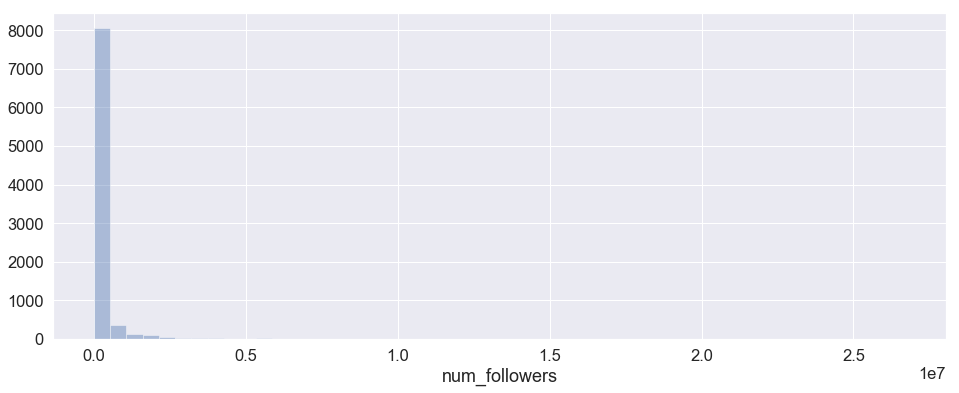

In [47]:
predictors = ['num_followers']
plot(df, predictors, 1, 1, (16,6), 'distribution')

From above, we found that the original `num_followers` distribution is extremely right skewed and that log transformation improves its symmetry. Therefore, we decided to take the log transformation of our response variable and use it from now on, deleting the `num_followers`.

[Text(0,0.5,'Frequency'), Text(0.5,0,'num_followers')]

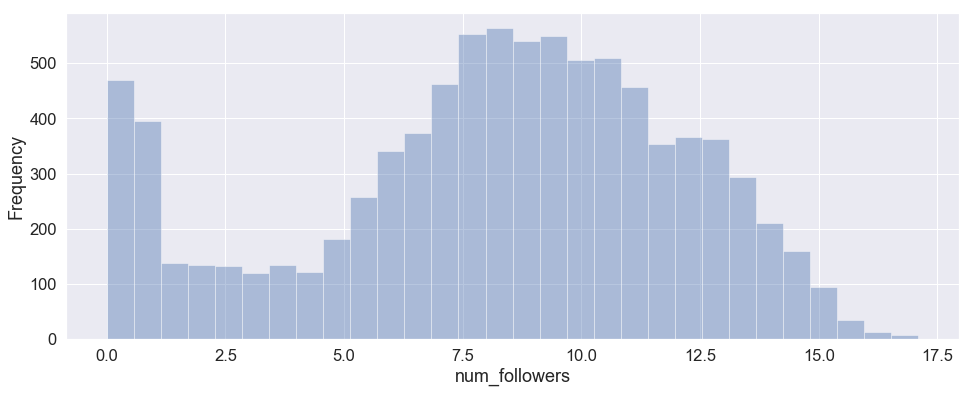

In [48]:
predictor = 'num_followers'
x = np.log(list(df['num_followers'] + 1))
fig, ax = plt.subplots(1, 1, figsize = (16,6))
ax = sns.distplot(x, hist=True,kde=False, bins=30)
ax.set(xlabel= predictor, ylabel = 'Frequency')

In [49]:
# Log transformation of num_followers 
df['log_num_followers'] = np.log(list(df['num_followers']+1))

# Dropping the original num_followers
df.drop(['num_followers'], axis=1, inplace=True)

### 2.2 Distributions of the features
<a id='section22'></a>

#### Categorical predictors 
For the categorical predictors, including the mode of **genre**, the mode of track **key**, and the mode of track **time signature**, we summarized the number of playlists in each category below. 


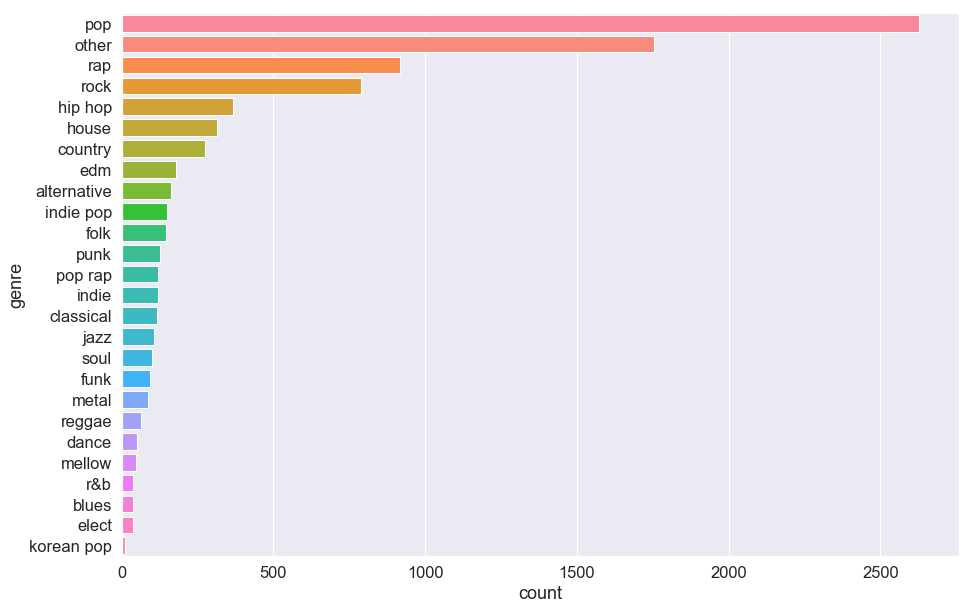

In [107]:
predictors = ['genre']
plot(df, predictors, 1, 1, (15,10), 'countplot')

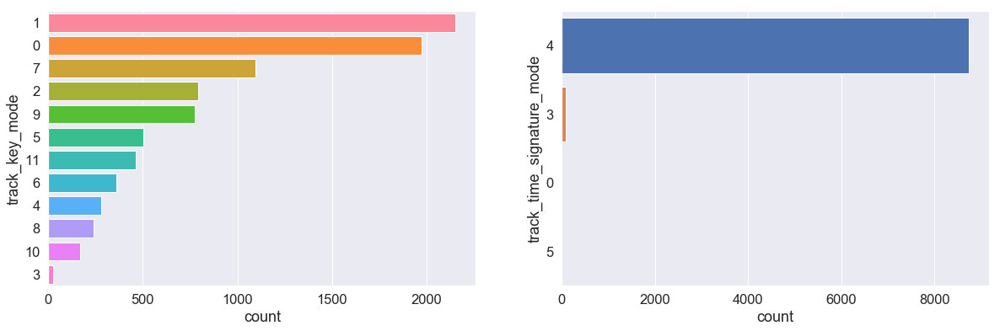

In [108]:
predictors = ['track_key_mode','track_time_signature_mode']
plot(df, predictors, 1, 2, (20,6),'countplot')

An estimated overall **time signature** of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

Integers map to pitches using standard Pitch Class notation and this mapping is called **key mode** . E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1.

From the plots above, it appears that the playlists we collected are very class inbalanced with most playlsits classified as "pop", most frequent key of **1** and most frequent time signature of **4**. This may be due to the fact that Spotify and other msuic streaming platforms are often places where people listen to popular, main stream music. Therefore, the most frequent artist genre (which we take as our playlist and track genre) is likely to be classified as pop, and pop music in general would have common traits (e.g. similar key and time signature). 

#### Numeric predictors
We classified numeric predictors into 2 different sets: 
- audio features 
- other features (track popularity, artist popularity, etc.)

**Distribution of Audio Features**

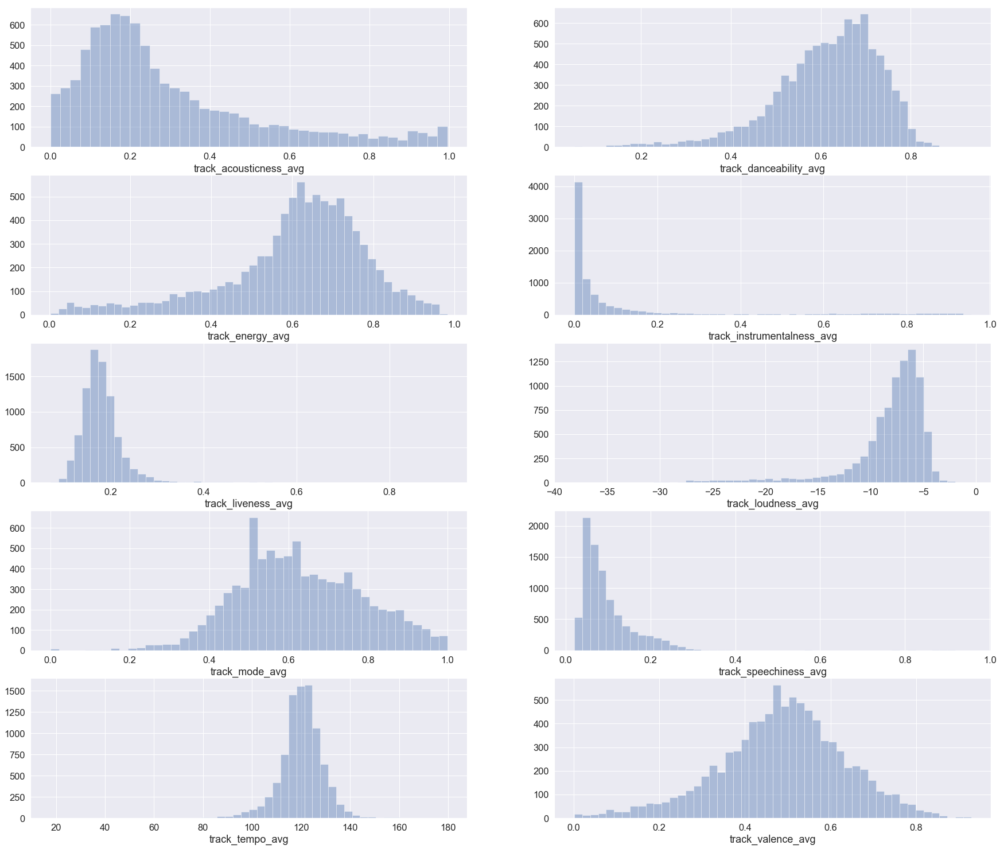

In [52]:
audio_features = ['track_acousticness_avg', 'track_danceability_avg', 
                'track_energy_avg', 'track_instrumentalness_avg', 
                'track_liveness_avg', 'track_loudness_avg', 'track_mode_avg', 'track_speechiness_avg',
                   'track_tempo_avg', 'track_valence_avg']

plot(df, audio_features, 5, 2, (30,26), 'distribution')

**Distribution of other numeric features**

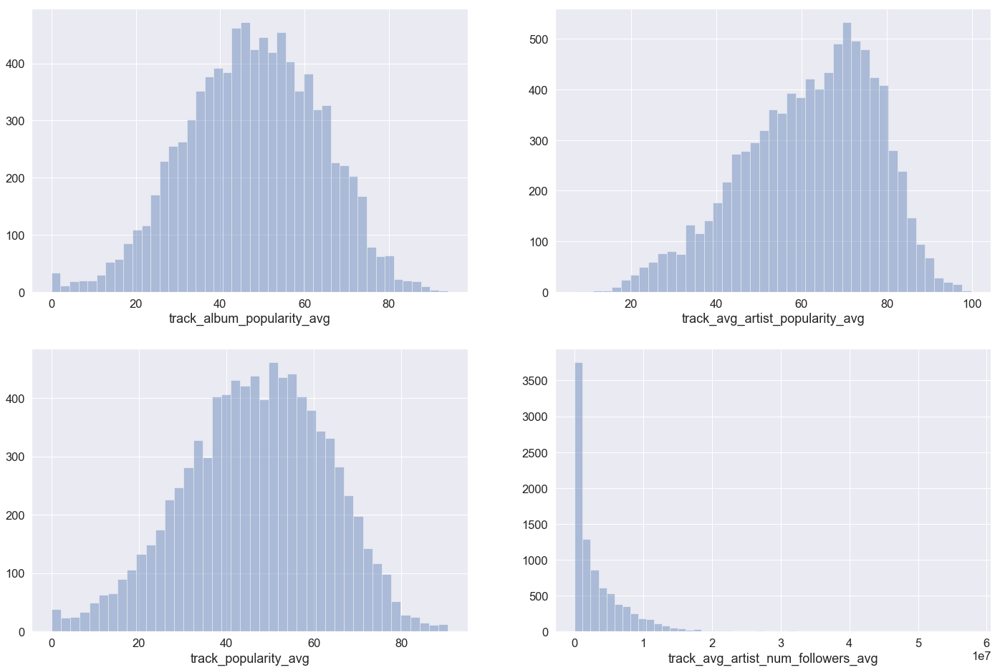

In [56]:
other_features = ['track_album_popularity_avg', 'track_avg_artist_popularity_avg', 
                'track_popularity_avg', 'track_avg_artist_num_followers_avg']
plot(df, other_features, 2, 2, (24,16), 'distribution')

From the histograms above, we found varying degrees of skewness in the predictor distributions.

### 2.3 Exploring the relationship between response and predictors

<a id='section23'></a>

#### Response vs. categorical features

<Figure size 1800x1440 with 0 Axes>

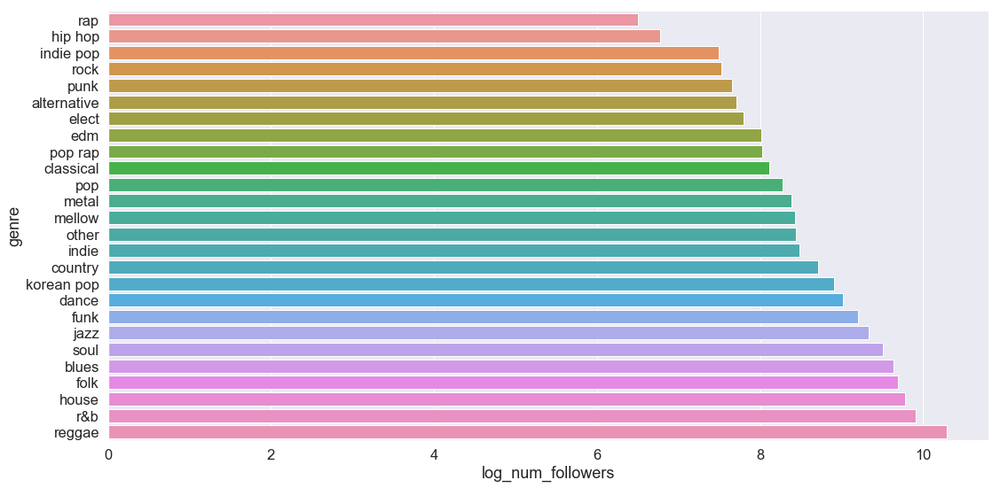

In [95]:
genre_follower_avg = df.groupby('genre')['log_num_followers'].apply(lambda x: np.mean(x)).sort_values()
temp = genre_follower_avg.to_frame()
temp = temp.reset_index()
sns.catplot(y ='genre', x ='log_num_followers', data= temp, kind ='bar', height=8, aspect=2) 

#### Response vs. selected numeric features

#### By popularities

We would like to double check the conception that average track popularity may have a high positive correlation with the number of followers a playlist has (i.e. higher average track popularity means high number of followers). Therefore, we first visualized `log_num_follwers` by 3 different types of popuarlities:
- **average popularity** of all **tracks** in the playlist
- **average popularity** of the **albums** of the tracks in the playlist
- **average popularit**y of the **artists** of the tracks in the playlist

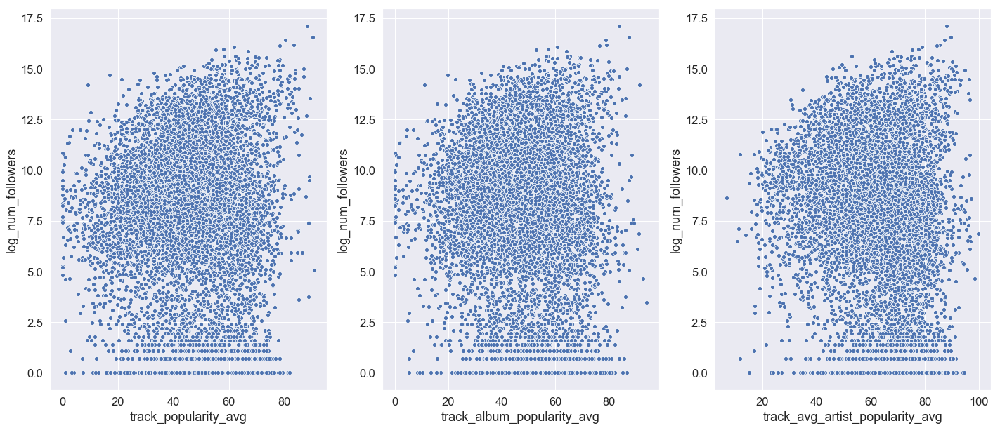

In [57]:
# popularity vs response
# visualize relationship between 'popularity' variables and the response variable
avg_popularity_predictors = ['track_popularity_avg', 'track_album_popularity_avg', 'track_avg_artist_popularity_avg']
plot(df, avg_popularity_predictors, 1, 3, (24,10), 'scatter')

While there seems to be an association between all 3 different kinds of popularities, none of the correlation appears to be strong.

#### By selected audio features

Next, we visualized the pair-wise relationship between the averages of all the audio features and the response.

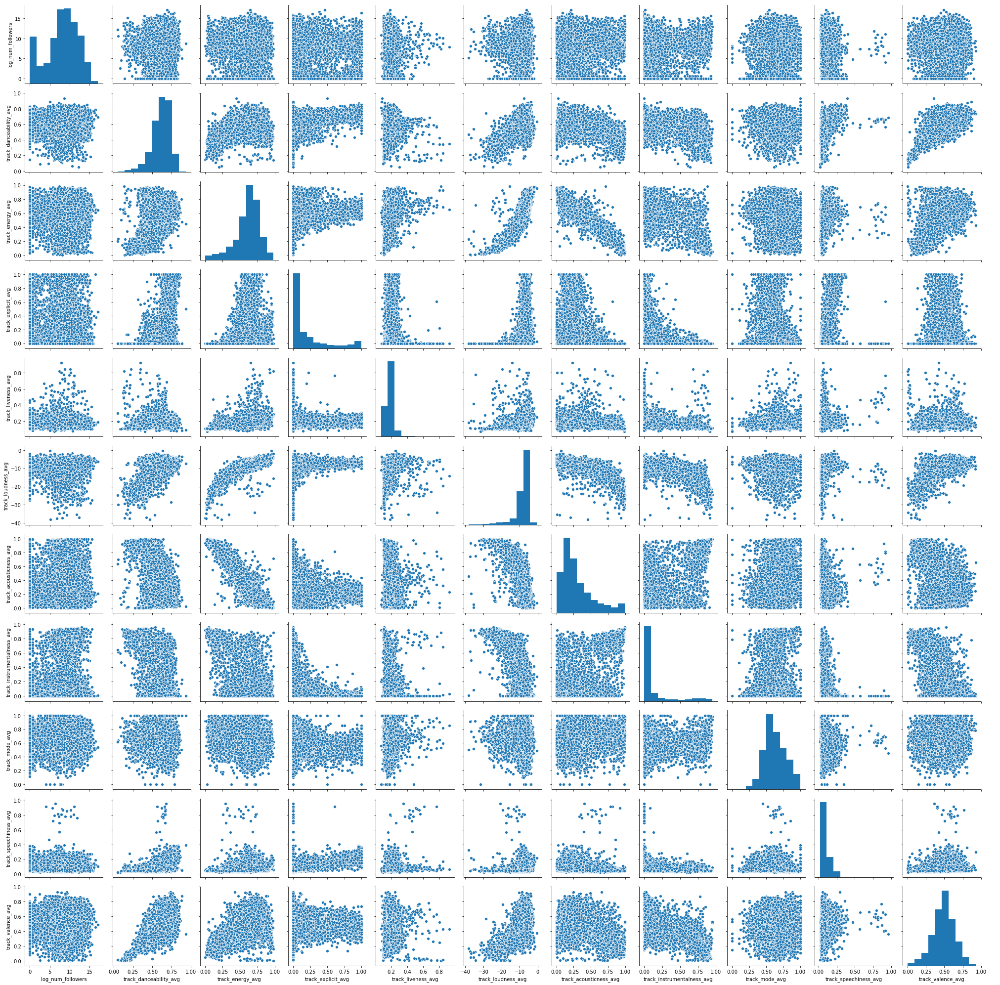

In [19]:
#pair plot shows that some predictors are highly correlated and do not have a trend with log_num_followers so we
#choose to group our observation by genre
pair_plot_features = ['log_num_followers','track_danceability_avg', 'track_energy_avg', 
                      'track_explicit_avg', 'track_liveness_avg', 'track_loudness_avg', 'track_acousticness_avg',
                      'track_instrumentalness_avg','track_mode_avg','track_speechiness_avg', 'track_valence_avg']
sns.pairplot(df[pair_plot_features])

Unsurprisingly, the plots revealed high multicollinearity between many of the audio features. This is expected because loud songs also tend to be energic, for example. 

In addition, the plots revealed that audio features overall do not correlate very much with the response. This is also intuitive because audio features are likely to be different in different genres, but there are popular and unpopular playlists in all genres, effectively cancelling out any potential correlation/trend with the response when overall audio features are considered. Therefore, we perofrm exploratory analysis by genre in the next section.

---

## 3. Exploratory analysis by genre
<a id='section3'></a>

### 3.1 Distribution of audio features by genre
<a id='section31'></a>
It is clear from both the boxplots and the parallel coordiate plots below that audio features in different genres cluster together. **This strongly suggests that we should pursue interaction terms between genre and all of the audio features when we build our regression model.**

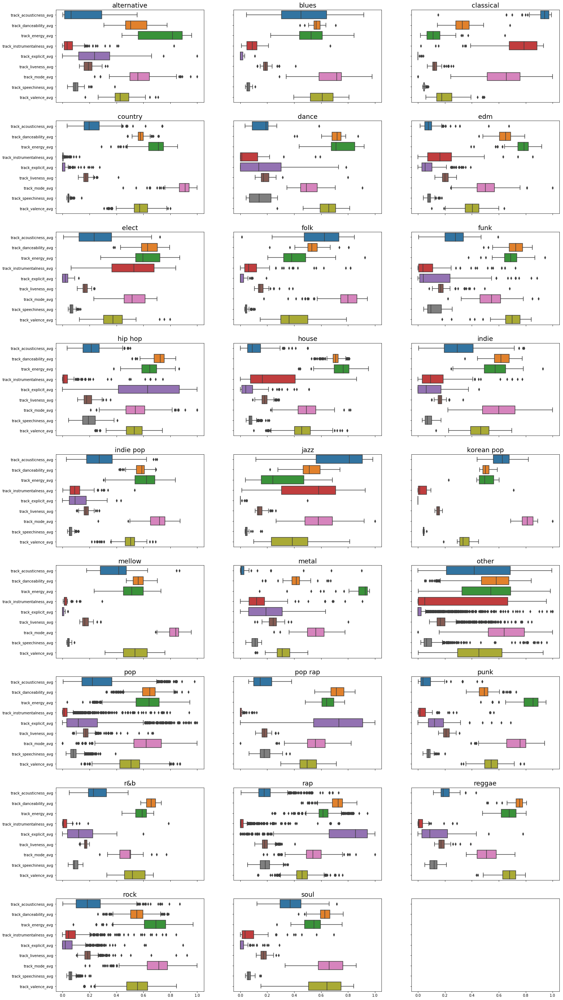

In [15]:
features = ['track_acousticness_avg', 'track_danceability_avg', 'track_energy_avg', 
                'track_instrumentalness_avg', 'track_explicit_avg', 'track_liveness_avg', 
                'track_mode_avg', 'track_speechiness_avg', 'track_valence_avg']
plot(df, features, 9, 3, (25 , 50), 'boxplot')

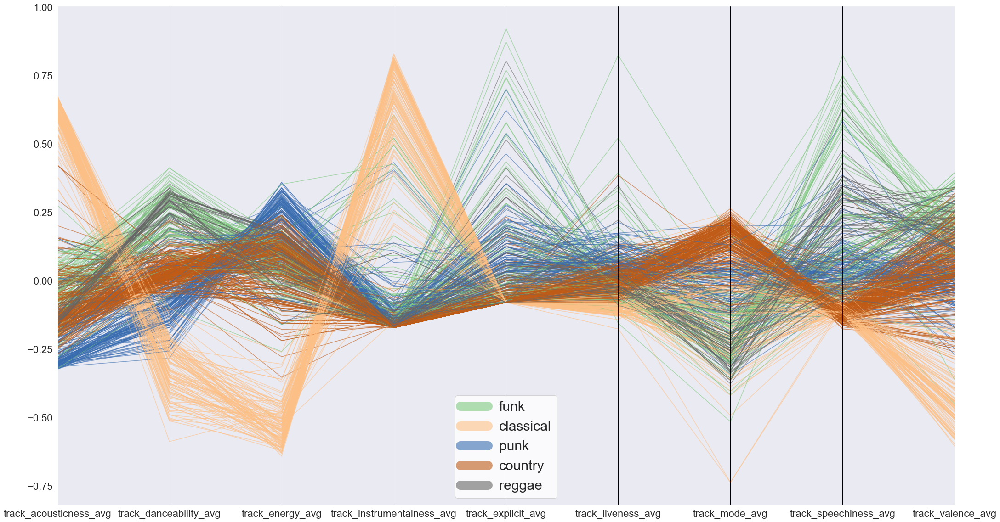

In [20]:
# parallel coordinates for numeric features
plot(df, features, 1, 1, (35,20), 'parallel')

Note: Since plotting every single genre (24 of them) would compromise the clarity of the parallel coordinate plot, we only plotted 5 genres to make our point.

### Distribution of other numeric features (popularities, number of available markets...etc) by genre

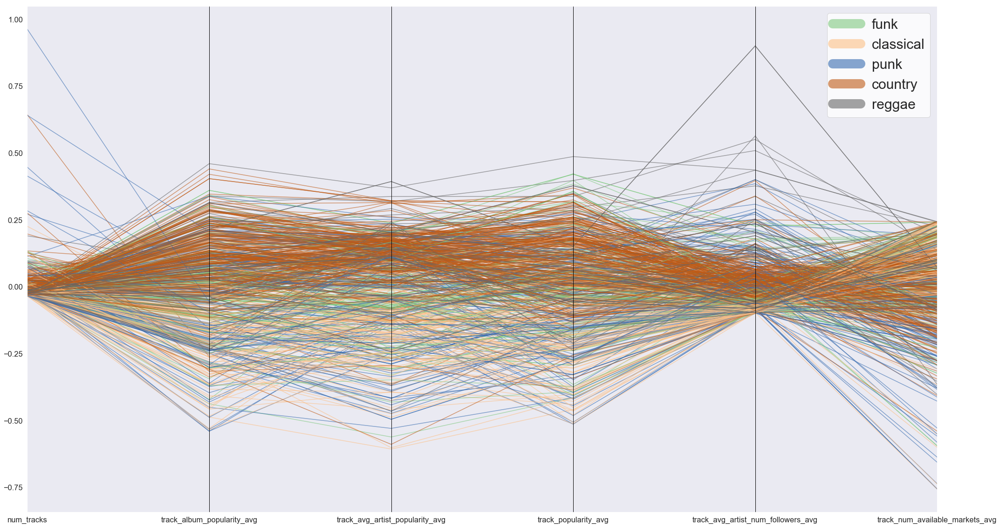

In [29]:
# parallel coordinates for numeric features
other_features = ['num_tracks', 'track_album_popularity_avg', 'track_avg_artist_popularity_avg', 
                'track_popularity_avg', 'track_avg_artist_num_followers_avg','track_num_available_markets_avg']
plot(df, other_features, 1, 1, (35,20), 'parallel')

From the parallel coordinate plot above, other numeric features do not appear to cluster based on genre, suggesting that interaction terms between genre and these features are not likely to contribute to predictive model building. 

### 3.2 Relationship between audio features and response
<a id='section32'></a>
Below, we only show the scatterplots of response vs. selected audio features in selected genres because there are too many combinations to show. In each of the scatterplot, we also drew a horizontal line in order to facilitate the detection of an association with the response. 

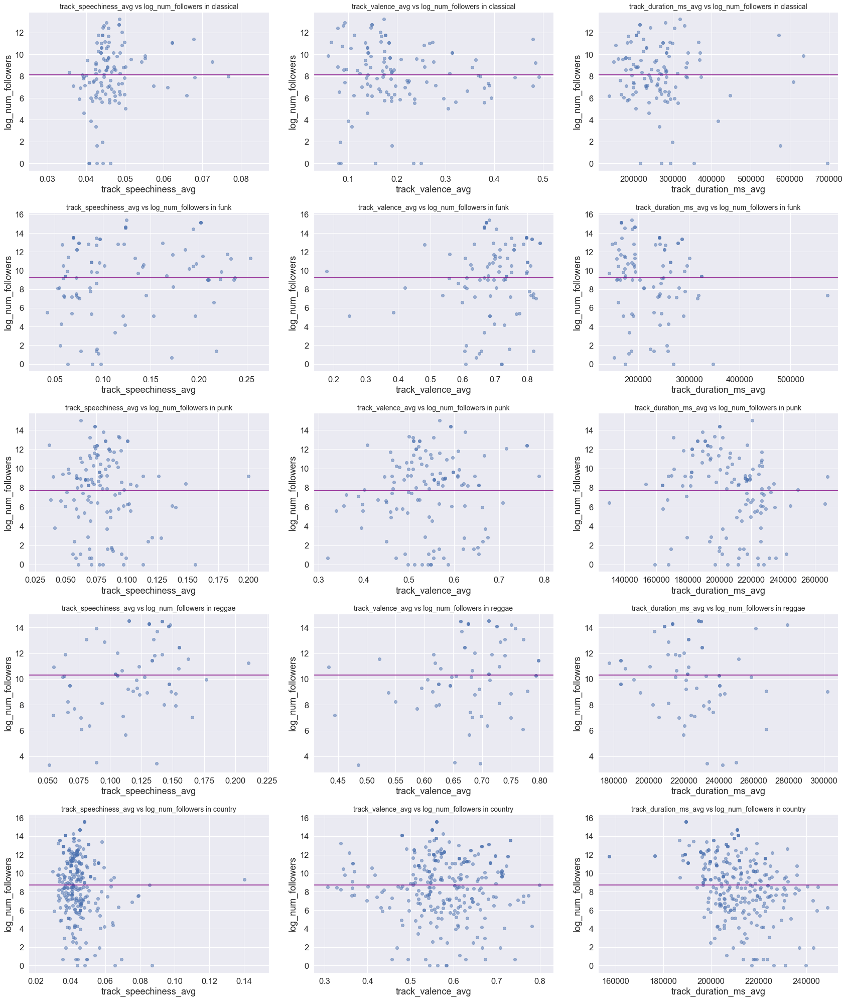

In [36]:
# plot for informative audio features against response variable after visualizing all audio features against the response
query_features = ['track_speechiness_avg', 'track_valence_avg', 'track_duration_ms_avg']
plot(df, query_features, 5, 3, (24, 28), 'scatterresponse')

------

## 4. Additional Data Analysis on tracks 
<a id='section4'></a>

In [4]:
# Load data files
directory = r'C:\Users\Luca\Desktop\Statistical Learning Project\OUR CODE\Data'
df_tracks = pd.read_csv(directory+r'\tracks.csv')
df_tracks.head()

,trackID,id,name,explicit,isrc,num_available_markets,danceability,energy,key,loudness,...,artists_names,artists_ids,artists_popularities,artists_num_followers,artists_genres,avg_artist_popularity,std_artist_popularity,avg_artist_num_followers,std_artist_num_followers,genre
0,6VKid1zSeLVUEV3oQR2i0k,6VKid1zSeLVUEV3oQR2i0k,Die Blaue Blume,False,SEXGF2013201,92,0.378,0.0603,0,-24.635,...,['Pontiver Bogross'],['3dlALRQ5FDfoMDLFkzwhcw'],[44],[61],['background piano'],44.0,0.0,61.0,0.0,other
1,1BZo2CHWy9gSgidvexgNYM,1BZo2CHWy9gSgidvexgNYM,Sabuelum,False,QZAKB2003543,92,0.291,0.0121,10,-28.978,...,['Johann Kurzweil'],['7u64sG9W2BjhBS7qfjBYxQ'],[42],[54],['background piano'],42.0,0.0,54.0,0.0,other
2,7nC2EOpMnpDT2DkvniimSm,7nC2EOpMnpDT2DkvniimSm,Lost,False,NLF9E2000005,92,0.389,0.1000,10,-22.464,...,['Annelie'],['0Rm9NmU9uyvf7tfVt4YNKC'],[58],[2846],['neo-classical'],58.0,0.0,2846.0,0.0,classical
3,7BbUNLqsUWQAM0QUNoFZWs,7BbUNLqsUWQAM0QUNoFZWs,Equus,False,SE5Q52001556,92,0.390,0.0434,2,-22.244,...,['S.A. Karl'],['5wvtkvwPR6pF2h7H6f08tM'],[59],[1017],"['background music', 'background piano', 'calm...",59.0,0.0,1017.0,0.0,other
4,39ObnHa9VOJIwR1nULLXJI,39ObnHa9VOJIwR1nULLXJI,Reisida,False,SE5W32046105,92,0.499,0.0321,0,-27.780,...,['Jan Thiel'],['2WrpycwxpswRBTsSnNMWCb'],[54],[519],['background piano'],54.0,0.0,519.0,0.0,other


In [59]:
len(df_tracks)

238434

### 4.1 Song Trends
<a id='section41'></a>

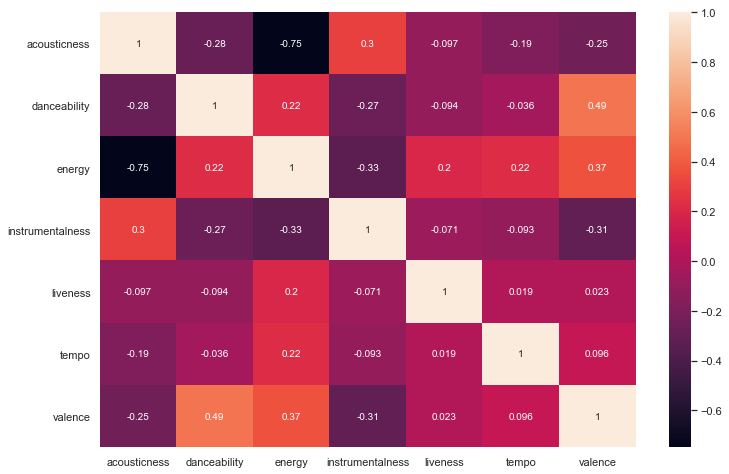

In [60]:
corr = df_tracks[['acousticness','danceability','energy','instrumentalness','liveness','tempo','valence']].corr()
sns.set(style='darkgrid')
%matplotlib inline
plt.figure(figsize=(12,8))
sns.heatmap(corr, annot=True)

There is a positive correlation between valence and danceability as we suspected. There seems to be a strong negative correlation between energy and acousticness.

Let’s also check top 10 artists in terms of average energy per song and compare the results with their average acousticness values.

In [61]:
df_tracks[['artists_names','energy','acousticness']].groupby('artists_names').mean().sort_values(by='energy', ascending=False)[:10]

,energy,acousticness
artists_names,,
['Forest FX Smith'],1.000,0.148000
['Gopnik McBlyat'],1.000,0.200000
"['Dr. Peacock', 'Nosferatu']",1.000,0.335000
['Spa Relaxation & Spa'],1.000,0.955000
"['Maissouille', 'Sefa']",1.000,0.235000
['White Noise Research'],1.000,0.539000
['Aquagen'],0.999,0.002260
['Ocean Sound Plus'],0.999,0.946000
['DJ Rentgen'],0.999,0.023300


In [62]:
df_tracks.acousticness.mean()

0.3194677019867959

With a few exceptions, artists with high energy songs produce low acousticness. The average acousticness in the entire dataset is 0.32

**Top 10** Artists with most songs in the dataset  

In [63]:
df_tracks.artists_names.value_counts()[:10]

['Bruce Springsteen']    369
['Taylor Swift']         368
['The Beatles']          354
['Workout Music Tv']     335
['Drake']                282
['Metallica']            281
['Glee Cast']            250
['Tabaluga']             240
['The Platters']         231
['The Meters']           220
Name: artists_names, dtype: int64

In [38]:
artist_list = df_tracks.artists_names.value_counts()[:10]

In [2]:
# Load data files
directory = r'C:\Users\Luca\Desktop\Statistical Learning Project\OUR CODE\Data'
data_frame = pd.read_csv(directory+r'\tracks.csv')

data_frame.head()

,trackID,id,name,explicit,isrc,num_available_markets,danceability,energy,key,loudness,...,artists_names,artists_ids,artists_popularities,artists_num_followers,artists_genres,avg_artist_popularity,std_artist_popularity,avg_artist_num_followers,std_artist_num_followers,genre
0,6VKid1zSeLVUEV3oQR2i0k,6VKid1zSeLVUEV3oQR2i0k,Die Blaue Blume,False,SEXGF2013201,92,0.378,0.0603,0,-24.635,...,['Pontiver Bogross'],['3dlALRQ5FDfoMDLFkzwhcw'],[44],[61],['background piano'],44.0,0.0,61.0,0.0,other
1,1BZo2CHWy9gSgidvexgNYM,1BZo2CHWy9gSgidvexgNYM,Sabuelum,False,QZAKB2003543,92,0.291,0.0121,10,-28.978,...,['Johann Kurzweil'],['7u64sG9W2BjhBS7qfjBYxQ'],[42],[54],['background piano'],42.0,0.0,54.0,0.0,other
2,7nC2EOpMnpDT2DkvniimSm,7nC2EOpMnpDT2DkvniimSm,Lost,False,NLF9E2000005,92,0.389,0.1000,10,-22.464,...,['Annelie'],['0Rm9NmU9uyvf7tfVt4YNKC'],[58],[2846],['neo-classical'],58.0,0.0,2846.0,0.0,classical
3,7BbUNLqsUWQAM0QUNoFZWs,7BbUNLqsUWQAM0QUNoFZWs,Equus,False,SE5Q52001556,92,0.390,0.0434,2,-22.244,...,['S.A. Karl'],['5wvtkvwPR6pF2h7H6f08tM'],[59],[1017],"['background music', 'background piano', 'calm...",59.0,0.0,1017.0,0.0,other
4,39ObnHa9VOJIwR1nULLXJI,39ObnHa9VOJIwR1nULLXJI,Reisida,False,SE5W32046105,92,0.499,0.0321,0,-27.780,...,['Jan Thiel'],['2WrpycwxpswRBTsSnNMWCb'],[54],[519],['background piano'],54.0,0.0,519.0,0.0,other


### 4.2 PCA on tracks
<a id='section42'></a>

Next, we generate a list of "chosen" traits and use principal component analysis to reduce the dimensions of that list to 3, effectively creating a matrix suitable for generating the following 3-dimensional plot. The lesser the distance between any two songs, the larger the similarities in their traits.

In [9]:
chosen_idx = np.random.choice(10000, replace=False, size=10000)
data_frame = df_tracks.iloc[chosen_idx]

In [11]:
chosen = ["energy", "liveness", "tempo", "valence", "loudness", "speechiness", "acousticness", "danceability", "instrumentalness"]
text1 = data_frame["artists_names"] + " - " + data_frame["name"]
text2 = text1.values

# X = data_frame.drop(droppable, axis=1).values
X = data_frame[chosen].values
y = data_frame["danceability"].values

min_max_scaler = MinMaxScaler()
X = min_max_scaler.fit_transform(X)

pca = PCA(n_components=3)
pca.fit(X)

X = pca.transform(X)

trace = go.Scatter3d(
    x=X[:,0],
    y=X[:,1],
    z=X[:,2],
    text=text2,
    mode="markers",
    marker=dict(
        size=8,
        color=y
    )
)

fig = go.Figure(data=[trace])
py.iplot(fig, filename="test-graph")

In another attempt, we use a smaller "chosen" list and PCA to generate a two-dimensional graph.This specific graph was chosen due to its seemingly spot-on axes naming.

In [13]:
chosen_idx = np.random.choice(10000, replace=False, size=5000)
data_frame = df_tracks.iloc[chosen_idx]

In [14]:
chosen = ["energy", "liveness", "tempo", "valence"]
text1 = data_frame["artists_names"] + " - " + data_frame["name"]
text2 = text1.values

# X = data_frame.drop(droppable, axis=1).values
X = data_frame[chosen].values
y = data_frame["loudness"].values

min_max_scaler = MinMaxScaler()
X = min_max_scaler.fit_transform(X)

pca = PCA(n_components=2)
pca.fit(X)

X = pca.transform(X)

fig = {
    "data": [
        {
            "x": X[:, 0],
            "y": X[:, 1],
            "text": text2,
            "mode": "markers",
            "marker": {"size": 8, "color": y}
        }
    ],
    "layout": {
        "xaxis": {"title": "How hard is this to dance to?"},
        "yaxis": {"title": "How metal is this?"}
    }
}

py.iplot(fig, filename="test-graph2")